In [1]:
import pandas as pd
import numpy as np
import scipy

import matplotlib.pyplot as plt
import seaborn as sns

from google.cloud import bigquery as bq

%matplotlib inline

In [2]:
subtype_expression_bigtable = pd.read_table("./datasets/subtype_expression_bigtable.IlluminaHiSeq.corr_genes.tsv", 
                                            sep="\t")

print(subtype_expression_bigtable.shape)
subtype_expression_bigtable.head()

/home/singuyen/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3020: DtypeWarning: Columns (11,12,13) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


(1544265, 16)


,case_barcode,sample_barcode,aliquot_barcode,gene_symbol,normalized_count,transformed_count,sample_type,sample_type_name,subtype,ER,PR,Her2_IHC,Her2_ISH,Her2,triple_negative,subtype_sub
0,TCGA-3C-AAAU,TCGA-3C-AAAU-01A,TCGA-3C-AAAU-01A-11R-A41B-07,AASS,45.8396,5.549657,1,Primary solid Tumor,LumA,Positive,Positive,NaN,NaN,NaN,Unknown,LumA
1,TCGA-3C-AAAU,TCGA-3C-AAAU-01A,TCGA-3C-AAAU-01A-11R-A41B-07,AATF,1518.9114,10.569772,1,Primary solid Tumor,LumA,Positive,Positive,NaN,NaN,NaN,Unknown,LumA
2,TCGA-3C-AAAU,TCGA-3C-AAAU-01A,TCGA-3C-AAAU-01A-11R-A41B-07,ABCA2,4507.4481,12.138415,1,Primary solid Tumor,LumA,Positive,Positive,NaN,NaN,NaN,Unknown,LumA
3,TCGA-3C-AAAU,TCGA-3C-AAAU-01A,TCGA-3C-AAAU-01A-11R-A41B-07,ABCB5,0.3447,0.427284,1,Primary solid Tumor,LumA,Positive,Positive,NaN,NaN,NaN,Unknown,LumA
4,TCGA-3C-AAAU,TCGA-3C-AAAU-01A,TCGA-3C-AAAU-01A-11R-A41B-07,ABCG1,1020.1901,9.996036,1,Primary solid Tumor,LumA,Positive,Positive,NaN,NaN,NaN,Unknown,LumA


In [3]:
df = subtype_expression_bigtable.drop_duplicates(subset="sample_barcode")

print("Sample types")
print(df.sample_type_name.value_counts())
print("\n")

print("BRCA subtypes")
print(df.loc[df['sample_type']==1].subtype_sub.value_counts())

Sample types
Primary solid Tumor    1095
Solid Tissue Normal     113
Metastatic                7
Name: sample_type_name, dtype: int64


BRCA subtypes
LumA        566
LumB        217
Basal       100
Basal-TN     90
Her2         82
Normal       40
Name: subtype_sub, dtype: int64


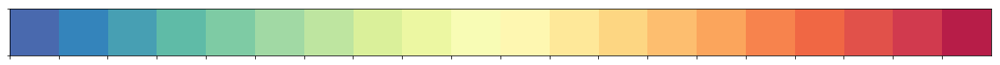

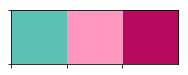

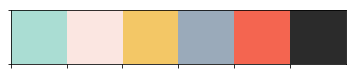

In [4]:
sns.palplot(sns.color_palette("Spectral_r", n_colors=20))
sns.palplot(sns.color_palette(["#5bc1b5", "#ff96c0", "#b7095d"])) 
sns.palplot(sns.color_palette(["#aaddd3", "#fbe6e1", "#f3c766", "#9aaaba", "#f46550", 
                               "#2b2b2b"]))

# Correlation

In [5]:
expression_matrix = subtype_expression_bigtable.pivot(index='gene_symbol', 
                                                      columns='aliquot_barcode', values='transformed_count')

print(expression_matrix.shape)
expression_matrix.head()

(1271, 1215)


aliquot_barcode,TCGA-3C-AAAU-01A-11R-A41B-07,TCGA-3C-AALI-01A-11R-A41B-07,TCGA-3C-AALJ-01A-31R-A41B-07,TCGA-3C-AALK-01A-11R-A41B-07,TCGA-4H-AAAK-01A-12R-A41B-07,TCGA-5L-AAT0-01A-12R-A41B-07,TCGA-5L-AAT1-01A-12R-A41B-07,TCGA-5T-A9QA-01A-11R-A41B-07,TCGA-A1-A0SB-01A-11R-A144-07,TCGA-A1-A0SD-01A-11R-A115-07,...,TCGA-UL-AAZ6-01A-11R-A41B-07,TCGA-UU-A93S-01A-21R-A41B-07,TCGA-V7-A7HQ-01A-11R-A33J-07,TCGA-W8-A86G-01A-21R-A36F-07,TCGA-WT-AB41-01A-11R-A41B-07,TCGA-WT-AB44-01A-11R-A41B-07,TCGA-XX-A899-01A-11R-A36F-07,TCGA-XX-A89A-01A-11R-A36F-07,TCGA-Z7-A8R5-01A-42R-A41B-07,TCGA-Z7-A8R6-01A-11R-A41B-07
gene_symbol,,,,,,,,,,,,,,,,,,,,,
AASS,5.549657,6.185432,6.269705,7.525796,8.596031,8.893473,8.360313,7.188584,8.697004,8.371397,...,4.495567,5.496299,6.128743,9.158558,6.246429,9.008284,9.029711,7.319358,7.938422,5.358164
AATF,10.569772,12.901294,11.035428,10.904020,10.362294,10.174936,10.292855,10.900933,9.846231,10.373893,...,10.375926,9.941978,10.875037,9.961057,11.258412,9.940270,10.117439,9.508675,10.677939,10.300382
ABCA2,12.138415,11.186777,11.648143,10.426536,9.889099,10.343339,10.334428,9.570642,10.707669,10.182636,...,10.627464,10.315734,10.887754,11.296615,10.306942,10.276899,10.674950,10.085470,9.904636,11.129658
ABCB5,0.427284,3.194812,2.468088,1.164271,0.511468,2.779470,5.975898,0.000000,1.233581,3.359395,...,0.846714,0.000000,0.000000,0.560324,1.750992,2.342697,5.908215,2.836086,2.530695,0.762136
ABCG1,9.996036,10.195112,9.196419,9.011511,10.329749,9.364487,10.231586,10.546168,12.128810,11.693152,...,10.702311,7.606752,9.388911,9.453368,9.856219,9.690149,10.092164,10.192425,10.284252,9.875207


In [6]:
corr = expression_matrix.corr()

In [7]:
print(corr.min().min())
print(corr.max().max())

0.562623276126859
1.0


# Include normal

In [8]:
color_matrix = pd.DataFrame()
df = subtype_expression_bigtable.drop_duplicates(subset="aliquot_barcode")

print(df['sample_type_name'].unique())
print(df['subtype'].unique())
print(df['triple_negative'].unique())

['Primary solid Tumor' 'Solid Tissue Normal' 'Metastatic']
['LumA' 'Her2' 'LumB' 'Normal' 'Basal']
['Unknown' 'Yes']


In [9]:
c = dict(zip(df['sample_type_name'].unique(), ["#ff96c0", "#5bc1b5", "#b7095d"]))
color_matrix['Sample type'] = df['sample_type_name'].map(c)

c = dict(zip(df['subtype'].unique(), ["#fbe6e1", "#9aaaba", "#f3c766", "#aaddd3", "#f46550", "#ffffff"]))
color_matrix['Subtype'] = df['subtype'].map(c)

c = dict(zip(df['triple_negative'].unique(), ["#ffffff", "#2b2b2b"]))
color_matrix['Triple negative'] = df['triple_negative'].map(c)

color_matrix.set_index(df['aliquot_barcode'], inplace=True)
color_matrix.head()

,Sample type,Subtype,Triple negative
aliquot_barcode,,,
TCGA-3C-AAAU-01A-11R-A41B-07,#ff96c0,#fbe6e1,#ffffff
TCGA-3C-AALI-01A-11R-A41B-07,#ff96c0,#9aaaba,#ffffff
TCGA-3C-AALJ-01A-31R-A41B-07,#ff96c0,#f3c766,#ffffff
TCGA-3C-AALK-01A-11R-A41B-07,#ff96c0,#fbe6e1,#ffffff
TCGA-4H-AAAK-01A-12R-A41B-07,#ff96c0,#fbe6e1,#ffffff


## data matrix - expression data

In [10]:
distance = scipy.spatial.distance.squareform(1-corr)
linkage = scipy.cluster.hierarchy.linkage(distance, method='average')
expression_matrix = subtype_expression_bigtable.pivot(index='gene_symbol', 
                                                      columns='aliquot_barcode', values='transformed_count')

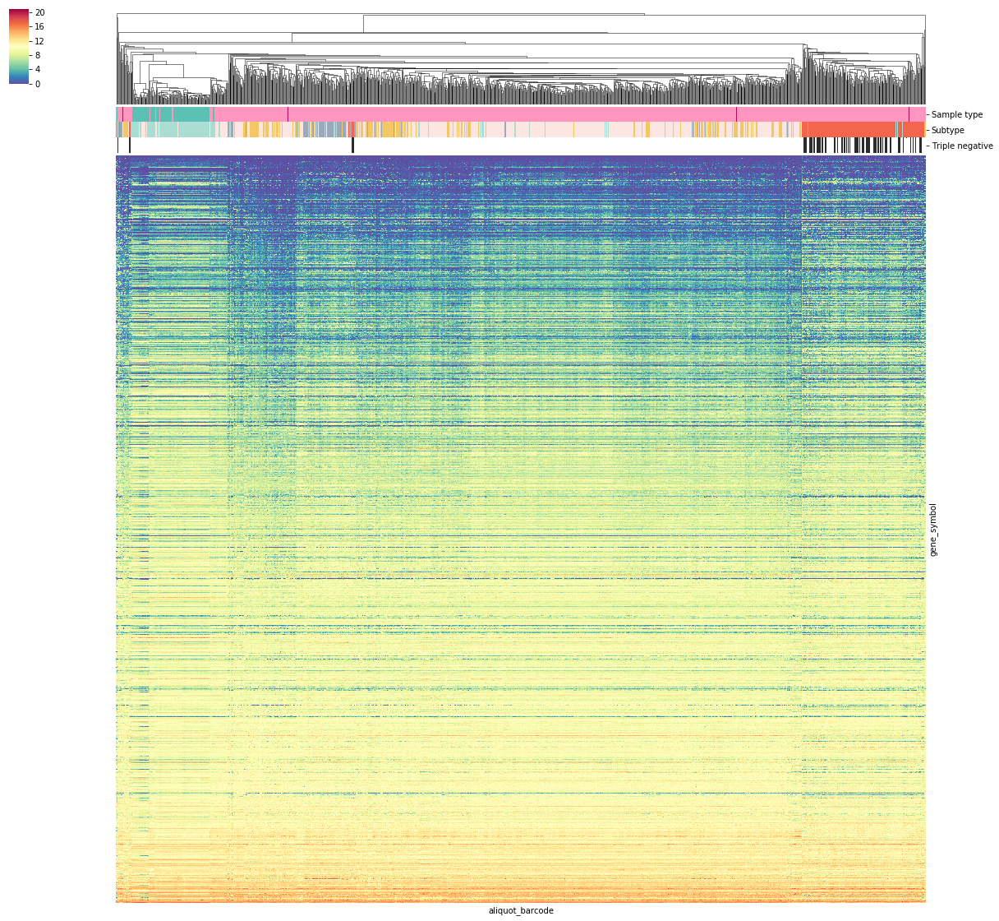

In [11]:
normal_aliquots = subtype_expression_bigtable.loc[subtype_expression_bigtable['sample_type'] != 11, 
                                                  'aliquot_barcode'].unique()

g = sns.clustermap(data=expression_matrix.sort_values(by=list(normal_aliquots)), 
                   col_linkage=linkage, row_cluster=False,
                   col_colors=color_matrix,
                   cmap="Spectral_r", vmin=0, vmax=21, figsize=(20,20), 
                   xticklabels=False, yticklabels=False)

In [12]:
g.savefig("./plots/cluster_expression.subtype.expressiondata.png", transparent=True, bbox_inches='tight')

## data matrix - correlation matrix

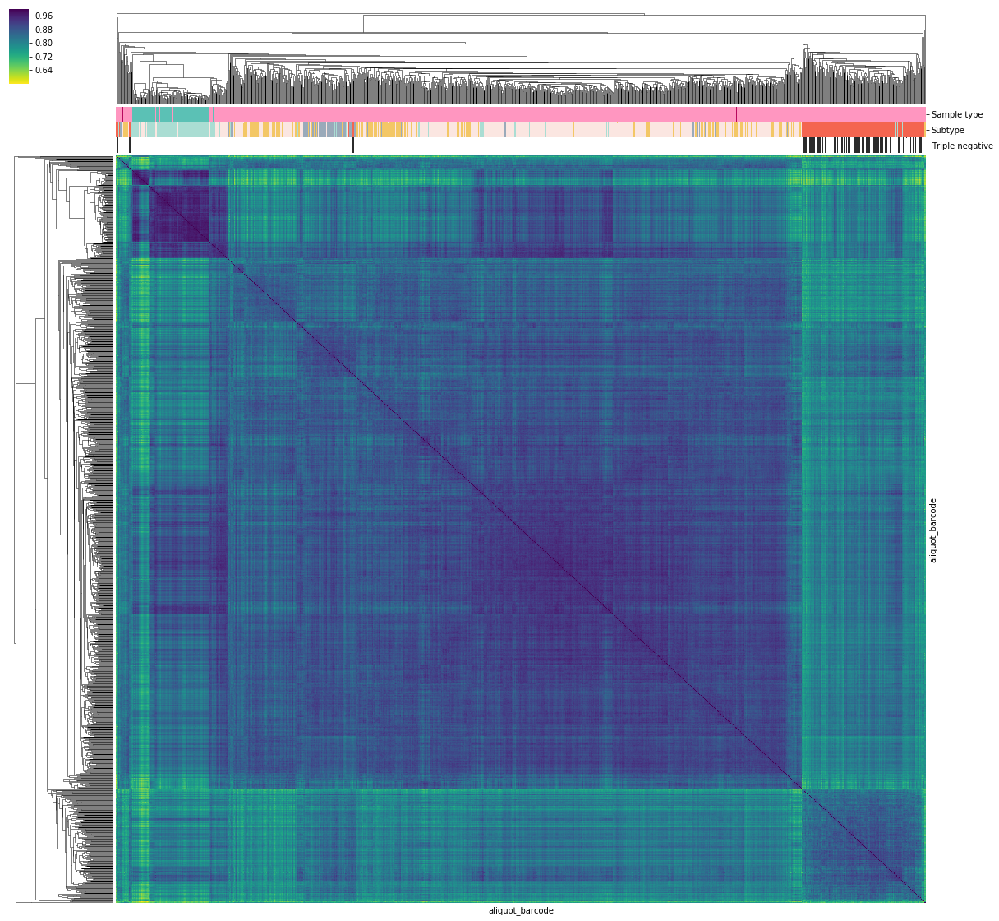

In [13]:
distance = scipy.spatial.distance.squareform(1-corr)
linkage = scipy.cluster.hierarchy.linkage(distance, method='average')

g1 = sns.clustermap(data=corr, col_linkage=linkage, row_linkage=linkage,
                    col_colors=color_matrix,
                    cmap="viridis_r", vmax=1, figsize=(20,20), 
                    xticklabels=False, yticklabels=False)

In [14]:
g1.savefig("./plots/cluster_expression.subtype.corrdata.png", transparent=True, bbox_inches='tight')

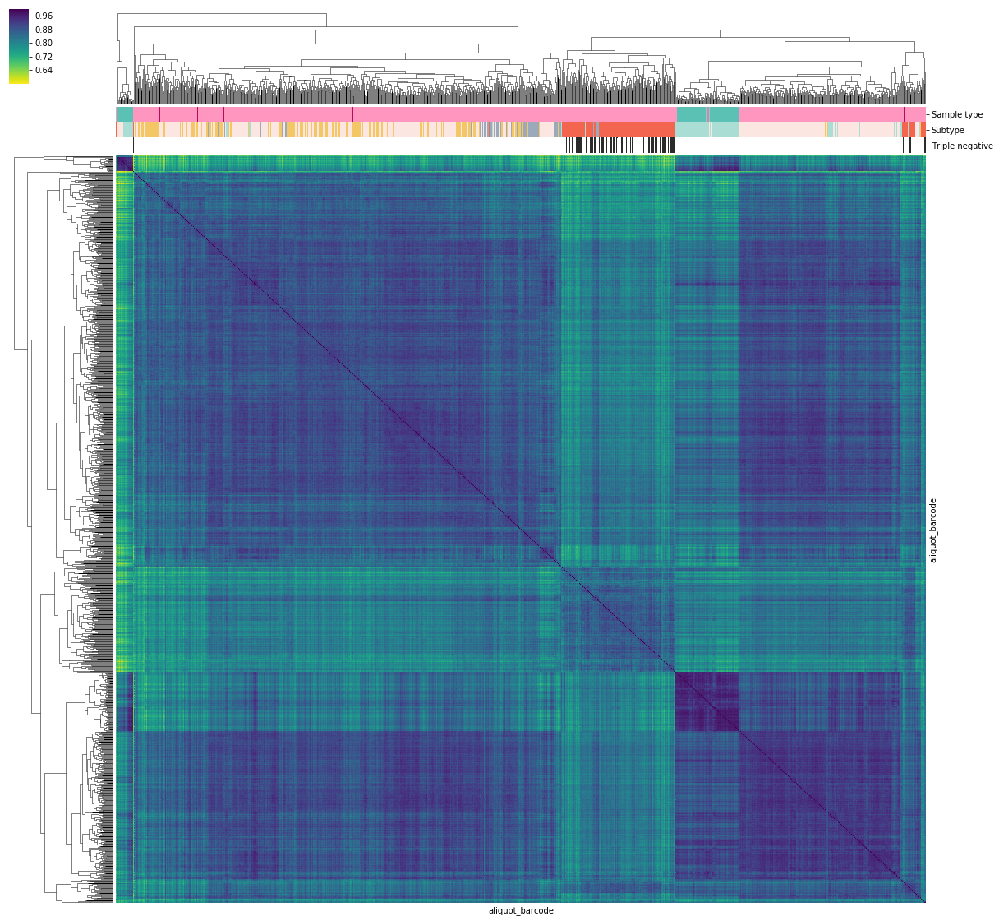

In [15]:
distance = scipy.spatial.distance.squareform(1-corr)
linkage = scipy.cluster.hierarchy.linkage(distance, method='complete')

sns.clustermap(data=corr, col_linkage=linkage, row_linkage=linkage,
               col_colors=color_matrix,
               cmap="viridis_r", vmax=1, figsize=(20,20), 
               xticklabels=False, yticklabels=False)

# Exclude normal

In [16]:
exclude_normal = subtype_expression_bigtable.loc[subtype_expression_bigtable['sample_type'] != 11]
corr_excl_normal = corr.loc[list(exclude_normal['aliquot_barcode'].unique()), 
                            list(exclude_normal['aliquot_barcode'].unique())]

print(exclude_normal.shape)
print(exclude_normal.head())

print(corr_excl_normal.shape)

(1400642, 16)
   case_barcode    sample_barcode               aliquot_barcode gene_symbol  \
0  TCGA-3C-AAAU  TCGA-3C-AAAU-01A  TCGA-3C-AAAU-01A-11R-A41B-07        AASS   
1  TCGA-3C-AAAU  TCGA-3C-AAAU-01A  TCGA-3C-AAAU-01A-11R-A41B-07        AATF   
2  TCGA-3C-AAAU  TCGA-3C-AAAU-01A  TCGA-3C-AAAU-01A-11R-A41B-07       ABCA2   
3  TCGA-3C-AAAU  TCGA-3C-AAAU-01A  TCGA-3C-AAAU-01A-11R-A41B-07       ABCB5   
4  TCGA-3C-AAAU  TCGA-3C-AAAU-01A  TCGA-3C-AAAU-01A-11R-A41B-07       ABCG1   

   normalized_count  transformed_count  sample_type     sample_type_name  \
0           45.8396           5.549657            1  Primary solid Tumor   
1         1518.9114          10.569772            1  Primary solid Tumor   
2         4507.4481          12.138415            1  Primary solid Tumor   
3            0.3447           0.427284            1  Primary solid Tumor   
4         1020.1901           9.996036            1  Primary solid Tumor   

  subtype        ER        PR Her2_IHC Her2_ISH Her2 t

In [17]:
exclude_normal.drop_duplicates(subset="aliquot_barcode")['subtype'].unique()

array(['LumA', 'Her2', 'LumB', 'Normal', 'Basal'], dtype=object)

In [18]:
exclude_normal.drop_duplicates(subset="aliquot_barcode")['triple_negative'].unique()

array(['Unknown', 'Yes'], dtype=object)

In [19]:
color_matrix = pd.DataFrame()
df = exclude_normal.drop_duplicates(subset="aliquot_barcode")

c = dict(zip(df['subtype'].unique(), ["#fbe6e1", "#9aaaba", "#f3c766", "#aaddd3", "#f46550", "#ffffff"]))
color_matrix['Subtype'] = df['subtype'].map(c)

c = dict(zip(df['triple_negative'].unique(), ["#ffffff", "#2b2b2b"]))
color_matrix['Triple negative'] = df['triple_negative'].map(c)

color_matrix.set_index(df['aliquot_barcode'], inplace=True)
color_matrix.head()

,Subtype,Triple negative
aliquot_barcode,,
TCGA-3C-AAAU-01A-11R-A41B-07,#fbe6e1,#ffffff
TCGA-3C-AALI-01A-11R-A41B-07,#9aaaba,#ffffff
TCGA-3C-AALJ-01A-31R-A41B-07,#f3c766,#ffffff
TCGA-3C-AALK-01A-11R-A41B-07,#fbe6e1,#ffffff
TCGA-4H-AAAK-01A-12R-A41B-07,#fbe6e1,#ffffff


## data matrix - expression data

In [20]:
distance = scipy.spatial.distance.squareform(1-corr_excl_normal)
linkage = scipy.cluster.hierarchy.linkage(distance, method='average')
expression_matrix = subtype_expression_bigtable.pivot(
                                    index='gene_symbol', columns='aliquot_barcode', values='transformed_count'
                                    ).loc[:,list(exclude_normal['aliquot_barcode'].unique())]

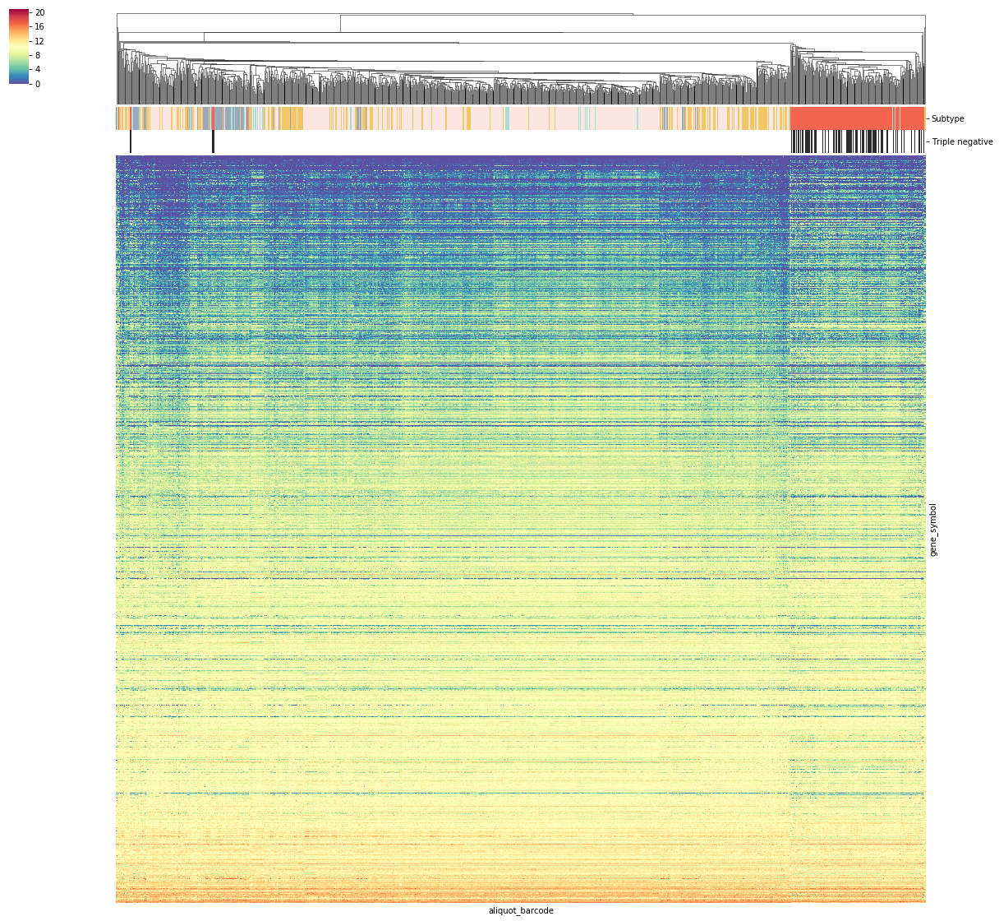

In [21]:
luminal_aliquots = exclude_normal.loc[(exclude_normal['subtype'] == 'LumA') | (exclude_normal['subtype'] == 'LumB'), 
                                      'aliquot_barcode'].unique()

g2 = sns.clustermap(data=expression_matrix.sort_values(by=list(luminal_aliquots)),
                   col_linkage=linkage, row_cluster = False,
                   col_colors=color_matrix,
                   cmap="Spectral_r", vmin=0, vmax=21, figsize=(20,20), 
                   xticklabels=False, yticklabels=False)

In [22]:
g2.savefig("./plots/cluster_expression.subtype.exclNormal.expressiondata.png", transparent=True, bbox_inches='tight')

## data matrix - correlation data

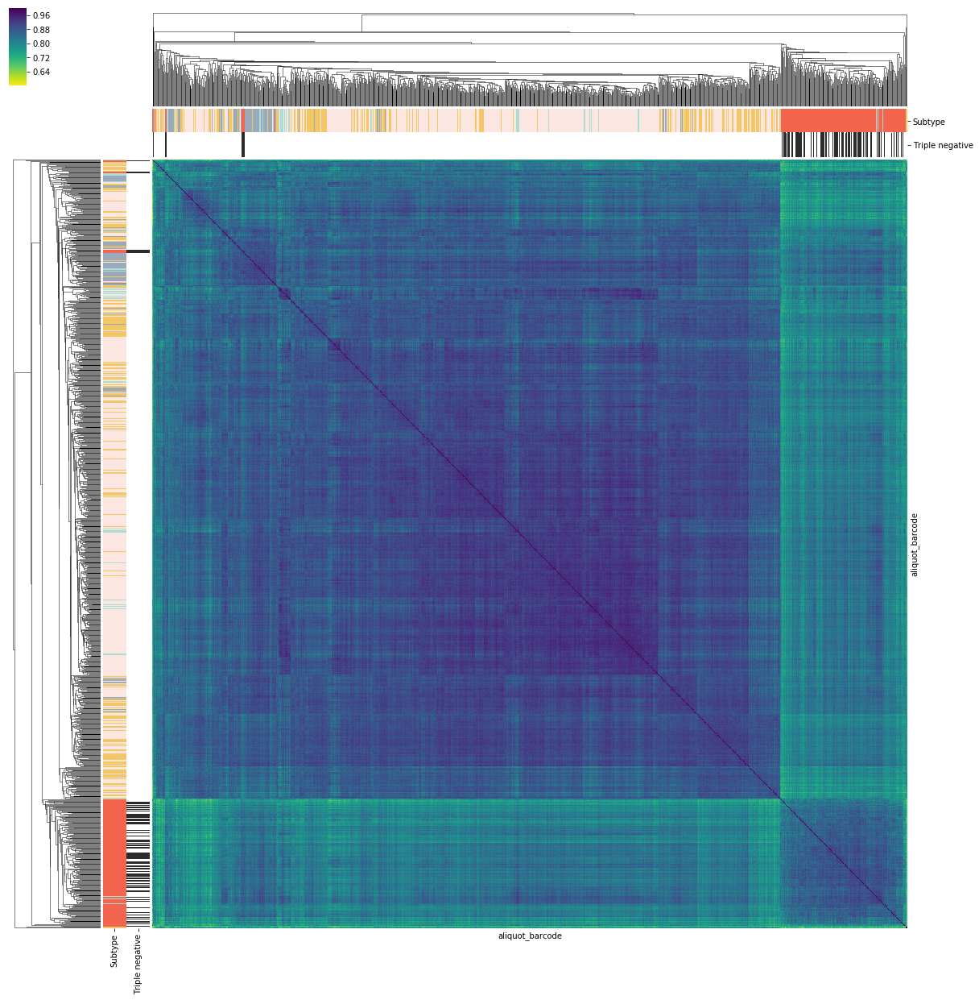

In [23]:
distance = scipy.spatial.distance.squareform(1-corr_excl_normal)
linkage = scipy.cluster.hierarchy.linkage(distance, method='average')

g3 = sns.clustermap(data=corr_excl_normal, col_linkage=linkage, row_linkage=linkage,
                    row_colors=color_matrix, col_colors = color_matrix,
                    cmap="viridis_r", vmax=1, figsize=(20,21), 
                    xticklabels=False, yticklabels=False)

In [24]:
g3.savefig("./plots/cluster_expression.subtype.exclNormal.corrdata.png", transparent=True, bbox_inches='tight')

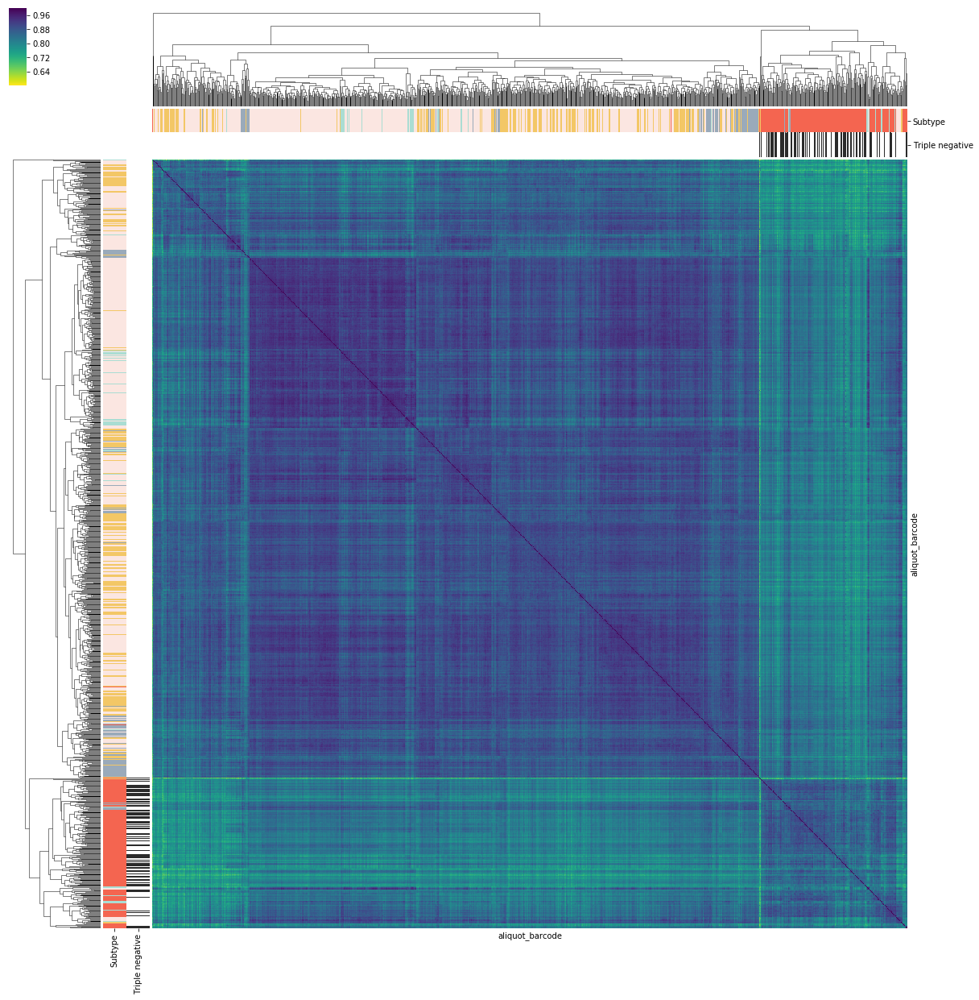

In [25]:
distance = scipy.spatial.distance.squareform(1-corr_excl_normal)
linkage = scipy.cluster.hierarchy.linkage(distance, method='complete')

sns.clustermap(data=corr_excl_normal, col_linkage=linkage, row_linkage=linkage,
               row_colors=color_matrix, col_colors = color_matrix,
               cmap="viridis_r", vmax=1, figsize=(20,21), 
               xticklabels=False, yticklabels=False)

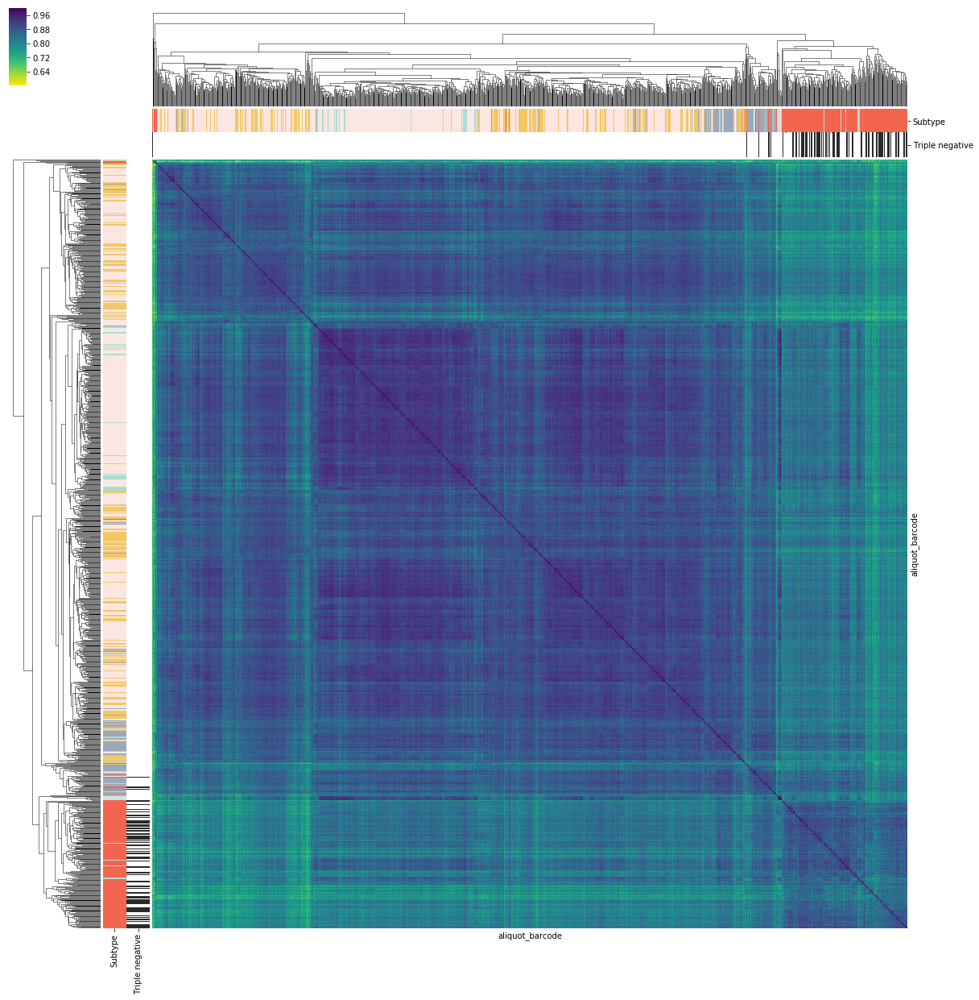

In [26]:
distance = scipy.spatial.distance.squareform(1-corr_excl_normal)
linkage = scipy.cluster.hierarchy.linkage(distance, method='weighted')

sns.clustermap(data=corr_excl_normal, col_linkage=linkage, row_linkage=linkage,
               row_colors=color_matrix, col_colors = color_matrix,
               cmap="viridis_r", vmax=1, figsize=(20,21), 
               xticklabels=False, yticklabels=False)

# Normal tissues only

In [27]:
normal_only = subtype_expression_bigtable.loc[subtype_expression_bigtable['sample_type'] == 11]
corr_normal = corr.loc[list(normal_only['aliquot_barcode'].unique()), 
                       list(normal_only['aliquot_barcode'].unique())]

print(normal_only.shape)
print(normal_only.head())

print(corr_normal.shape)

(143623, 16)
        case_barcode    sample_barcode               aliquot_barcode  \
160146  TCGA-A7-A0CE  TCGA-A7-A0CE-11A  TCGA-A7-A0CE-11A-21R-A089-07   
160147  TCGA-A7-A0CE  TCGA-A7-A0CE-11A  TCGA-A7-A0CE-11A-21R-A089-07   
160148  TCGA-A7-A0CE  TCGA-A7-A0CE-11A  TCGA-A7-A0CE-11A-21R-A089-07   
160149  TCGA-A7-A0CE  TCGA-A7-A0CE-11A  TCGA-A7-A0CE-11A-21R-A089-07   
160150  TCGA-A7-A0CE  TCGA-A7-A0CE-11A  TCGA-A7-A0CE-11A-21R-A089-07   

       gene_symbol  normalized_count  transformed_count  sample_type  \
160146        AASS          592.6984           9.213586           11   
160147        AATF         1138.7302          10.154477           11   
160148       ABCA2         1164.7619          10.187057           11   
160149       ABCB5           96.8254           6.612137           11   
160150       ABCG1          507.6190           8.990442           11   

           sample_type_name subtype        ER        PR Her2_IHC  Her2_ISH  \
160146  Solid Tissue Normal  Normal  Negati

In [28]:
corr_normal.min().min()

0.6952875780055982

In [29]:
print(normal_only.drop_duplicates(subset="aliquot_barcode")['subtype'].unique())
normal_only.drop_duplicates(subset="aliquot_barcode")['subtype'].value_counts()

['Normal' 'LumA']


Normal    101
LumA       12
Name: subtype, dtype: int64

In [30]:
color_matrix = pd.DataFrame()
df = normal_only.drop_duplicates(subset="aliquot_barcode")

c = dict(zip(df['subtype'].unique(), ["#aaddd3", "#fbe6e1"]))
color_matrix['Subtype'] = df['subtype'].map(c)

color_matrix.set_index(df['aliquot_barcode'], inplace=True)
color_matrix.head()

,Subtype
aliquot_barcode,
TCGA-A7-A0CE-11A-21R-A089-07,#aaddd3
TCGA-A7-A0CH-11A-32R-A089-07,#aaddd3
TCGA-A7-A0D9-11A-53R-A089-07,#aaddd3
TCGA-A7-A0DB-11A-33R-A089-07,#aaddd3
TCGA-A7-A0DC-11A-41R-A089-07,#aaddd3


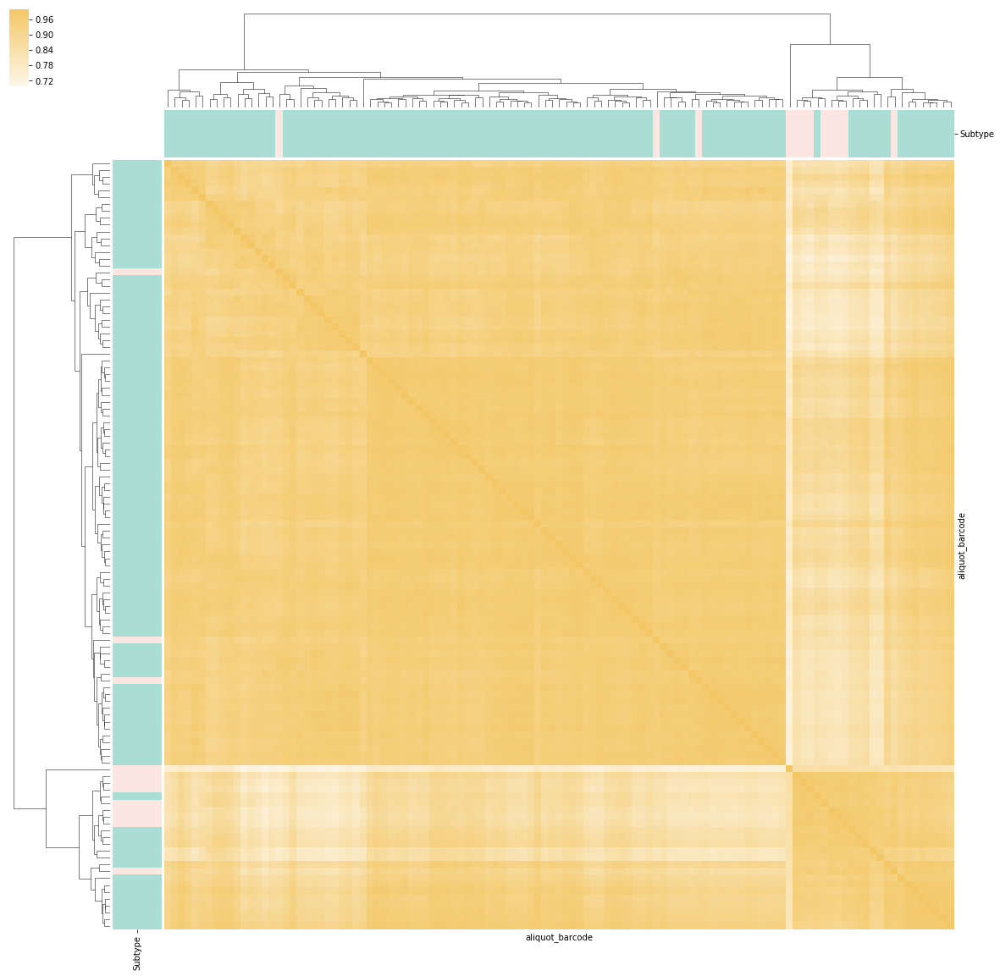

In [32]:
distance = scipy.spatial.distance.squareform(1-corr_normal)
linkage = scipy.cluster.hierarchy.linkage(distance, method='complete')

sns.clustermap(data=corr_normal, col_linkage=linkage, row_linkage=linkage,
               row_colors=color_matrix, col_colors = color_matrix,
               cmap=sns.light_palette("#f3c766", input="hex", as_cmap=True), vmin=0.7, vmax=1, figsize=(20,20), 
               xticklabels=False, yticklabels=False)